## PRCP-1009-CellphonePrice


### Problem Statement
Find out some relation between features of a mobile phone(eg:- RAM, Internal Memory etc) and its selling price. In this problem you do not have to predict the actual price but a price range indicating how high the price is.

Task 1:- Prepare a complete data analysis report on the given data.

Task 2:- On the basis of the mobile Specification like Battery power, 3G enabled , wifi ,Bluetooth, Ram etc predict the Price range of the mobile.

Task 3:- Prepare the analysis report stating how model will help expanding the business by stating several factors including feature importance.



In [1]:
# importing all needed libraries 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
#display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

In [3]:
#loading dataset
df=pd.read_csv("Cellphoneprice.csv")
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0


#### Domain Analysis

#### Input Variables

* battery_power = Total energy a battery can store in one time measured in mAh(Continuous)
* blue = Has bluetooth or not (Categorical)
* clock_speed = speed at which microprocessor executes instructions(Continuous)
* dual_sim = Has dual sim support or not (Categorical)
* fc = Front Camera mega pixels(Continuous)
* four_g = Has 4G or not (Categorical)
* int_memory = Internal Memory in Gigabytes(Continuous)
* m_dep = Mobile Depth in cm(Continuous)
* mobile_wt = Weight of mobile phone(Continuous)
* n_cores = Number of cores of processor(Continuous)
* pc = Primary Camera mega pixels(Continuous)
* px_height = Pixel Resolution Height(Continuous)
* px_weight = Pixel Resolution Weight(Continuous)
* ram = Random Access Memory in Megabytes(Continuous)
* sc_h = Screen Height of mobile in cm(Continuous)
* sc_w = Screen Width of mobile in cm(Continuous)
* talk_time = longest time that a single battery charge will last when you are(Continuous)
* three_g = Has 3G or not (Categorical)
* touch_screen = Has touch screen or not (Categorical)
* wifi = Has wifi or not(Categorical)

#### Output Variables

* Price Range = This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

#### Basic checks

In [4]:
df.shape

(2000, 21)

In [5]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [6]:
df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


In [7]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [9]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

#### Exploratory data analysis

In [26]:
from ydata_profiling import ProfileReport
pro=ProfileReport(df,title="EDA")
pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Distribution of the Price Range

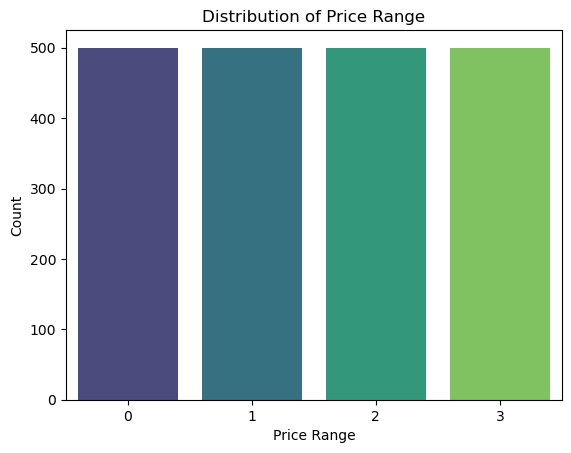

In [27]:
sns.countplot(x='price_range', data=df, palette='viridis')
plt.title('Distribution of Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

####  Box plot for RAM against price_range

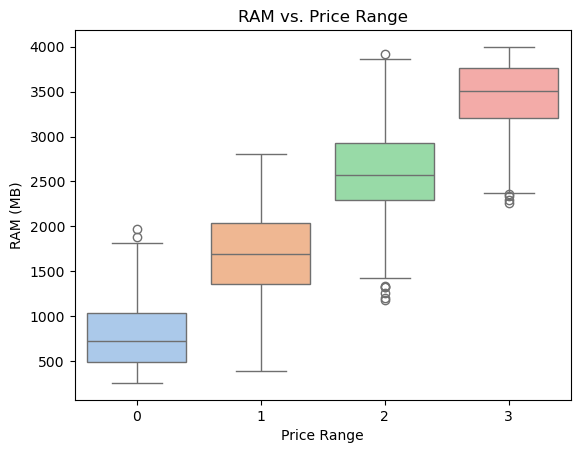

In [28]:
sns.boxplot(x='price_range', y='ram', data=df, palette='pastel')
plt.title('RAM vs. Price Range')
plt.xlabel('Price Range')
plt.ylabel('RAM (MB)')
plt.show()

#### Scatter plot for battery_power vs. price_range

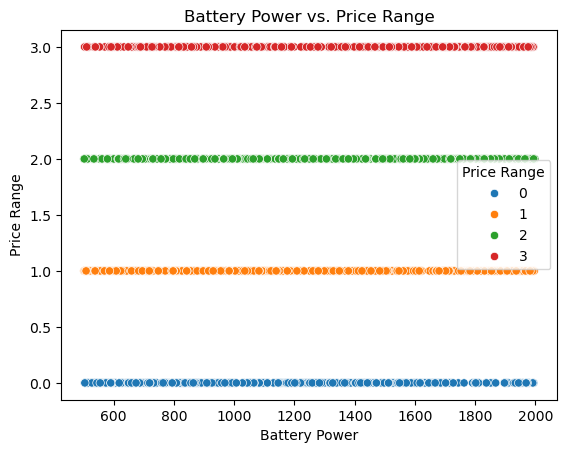

In [29]:
sns.scatterplot(x='battery_power', y='price_range', hue='price_range', data=df, palette='tab10')
plt.title('Battery Power vs. Price Range')
plt.xlabel('Battery Power')
plt.ylabel('Price Range')
plt.legend(title='Price Range')
plt.show()

#### Scatter plot for screen resolution

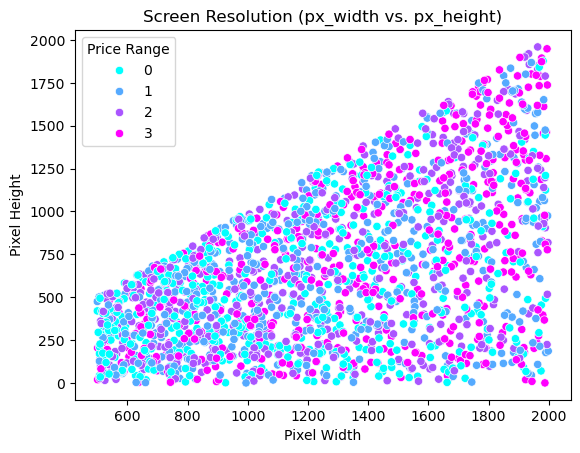

In [30]:
sns.scatterplot(x='px_width', y='px_height', hue='price_range', data=df, palette='cool')
plt.title('Screen Resolution (px_width vs. px_height)')
plt.xlabel('Pixel Width')
plt.ylabel('Pixel Height')
plt.legend(title='Price Range')
plt.show()

#### Plot for 3G effect

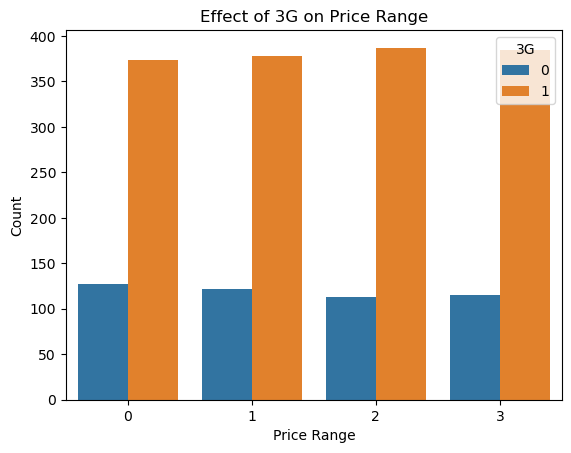

In [31]:
sns.countplot(x='price_range', hue='three_g', data=df)
plt.title('Effect of 3G on Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.legend(title='3G')
plt.show()

#### Plot for 4G effect

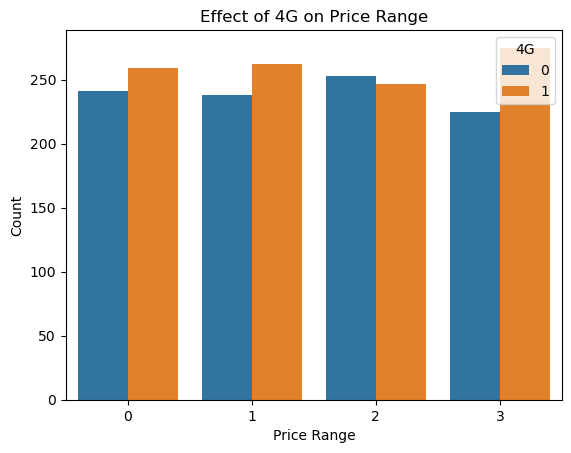

In [32]:
sns.countplot(x='price_range', hue='four_g', data=df)
plt.title('Effect of 4G on Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.legend(title='4G')
plt.show()

#### Count Plot for Dual SIM Phones

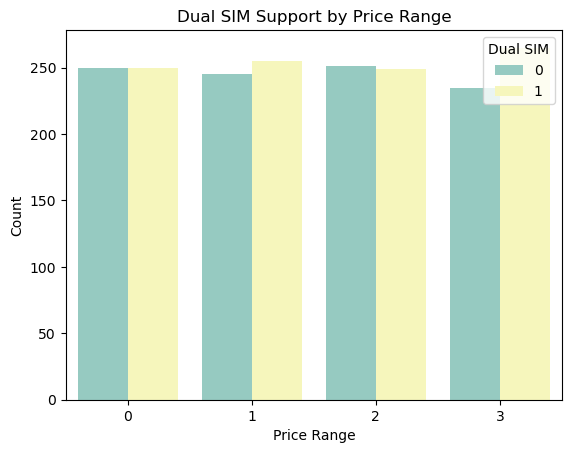

In [33]:
sns.countplot(x='price_range', hue='dual_sim', data=df, palette='Set3')
plt.title('Dual SIM Support by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.legend(title='Dual SIM')
plt.show()

#### Plotting of BoxPlot to check presence of Outliers

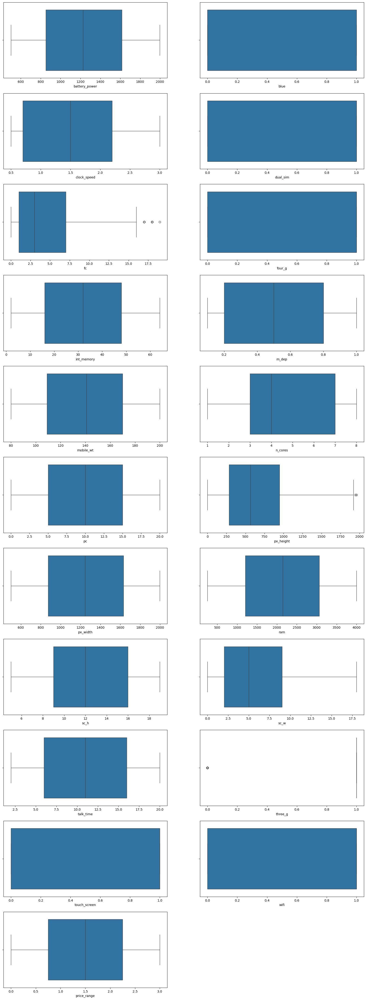

In [34]:


plt.figure(figsize=(20,55),facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=21:
        ax=plt.subplot(11,2,plotnumber)
        sns.boxplot(x=df[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

#### Observation:
The outliers are founds in the belows columns_name:
- fc
- px_height
- three_g

#### Plotting of DistPlot to check presence of normal distribution


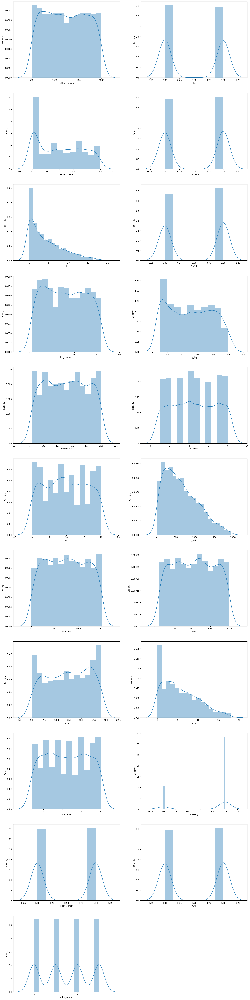

In [20]:

plt.figure(figsize=(20,85),facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=21:
        ax=plt.subplot(11,2,plotnumber)
        sns.distplot(x=df[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

#### Plotting the distribution of each column in 'df' using Seaborn

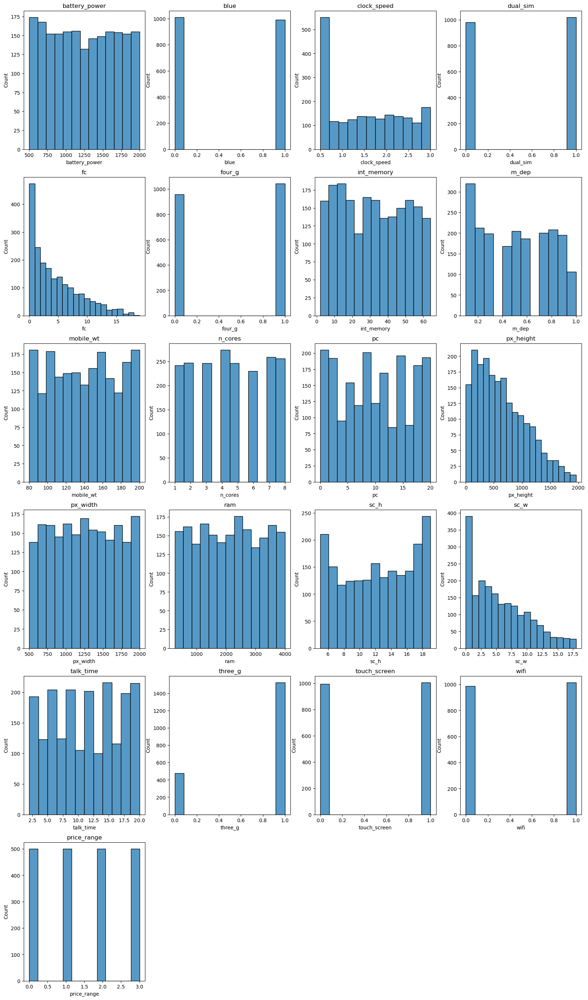

In [22]:

plt.figure(figsize=(20,35))
i=1
for x in df.columns:
    plt.subplot(6,4,i)
    sns.histplot(df[x])
    plt.title(x)
    i+=1

#### Correlation Heatmap

<Axes: title={'center': 'Correlation Heatmap'}>

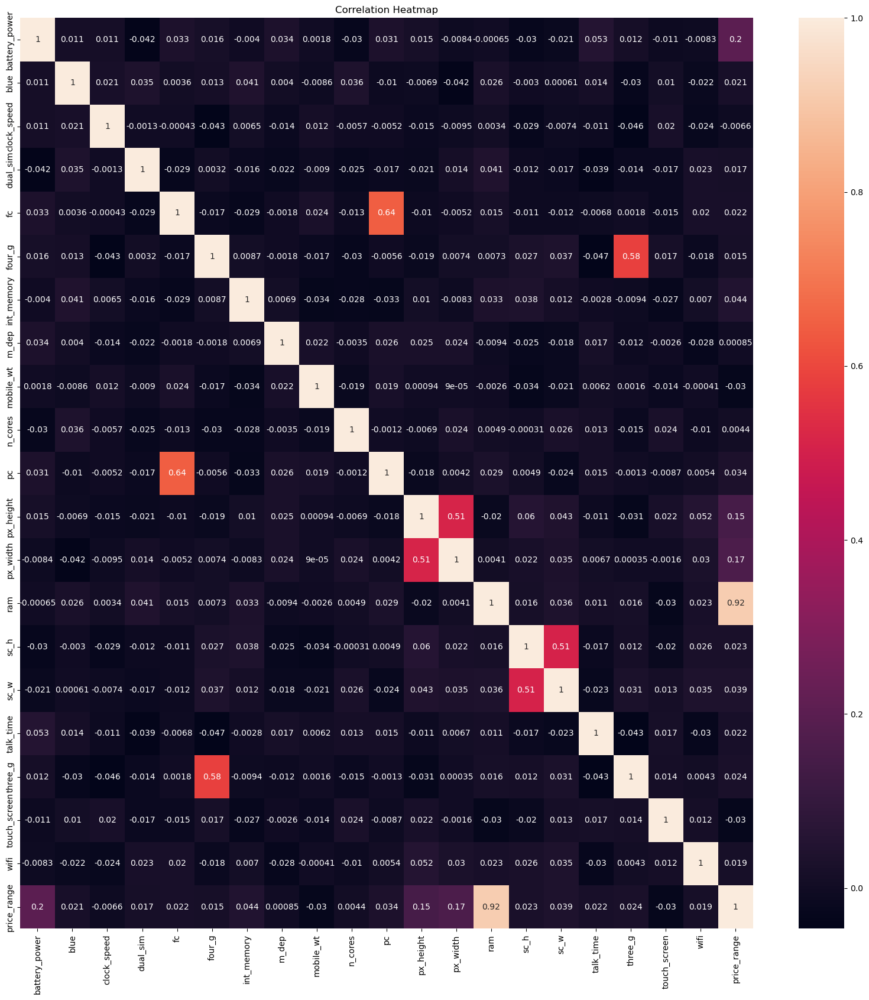

In [35]:
plt.figure(figsize=(20,20))
plt.title('Correlation Heatmap')
sns.heatmap(df.corr(),annot=True)

In [24]:
df.corr()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.011252,0.011482,-0.041847,0.033334,0.015665,-0.004004,0.034085,0.001844,-0.029727,0.031441,0.014901,-0.008402,-0.000653,-0.029959,-0.021421,0.052510,0.011522,-0.010516,-0.008343,0.200723
blue,0.011252,1.000000,0.021419,0.035198,0.003593,0.013443,0.041177,0.004049,-0.008605,0.036161,-0.009952,-0.006872,-0.041533,0.026351,-0.002952,0.000613,0.013934,-0.030236,0.010061,-0.021863,0.020573
clock_speed,0.011482,0.021419,1.000000,-0.001315,-0.000434,-0.043073,0.006545,-0.014364,0.012350,-0.005724,-0.005245,-0.014523,-0.009476,0.003443,-0.029078,-0.007378,-0.011432,-0.046433,0.019756,-0.024471,-0.006606
dual_sim,-0.041847,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.015679,-0.022142,-0.008979,-0.024658,-0.017143,-0.020875,0.014291,0.041072,-0.011949,-0.016666,-0.039404,-0.014008,-0.017117,0.022740,0.017444
fc,0.033334,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.029133,-0.001791,0.023618,-0.013356,0.644595,-0.009990,-0.005176,0.015099,-0.011014,-0.012373,-0.006829,0.001793,-0.014828,0.020085,0.021998
four_g,0.015665,0.013443,-0.043073,0.003187,-0.016560,1.000000,0.008690,-0.001823,-0.016537,-0.029706,-0.005598,-0.019236,0.007448,0.007313,0.027166,0.037005,-0.046628,0.584246,0.016758,-0.017620,0.014772
int_memory,-0.004004,0.041177,0.006545,-0.015679,-0.029133,0.008690,1.000000,0.006886,-0.034214,-0.028310,-0.033273,0.010441,-0.008335,0.032813,0.037771,0.011731,-0.002790,-0.009366,-0.026999,0.006993,0.044435
m_dep,0.034085,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,0.006886,1.000000,0.021756,-0.003504,0.026282,0.025263,0.023566,-0.009434,-0.025348,-0.018388,0.017003,-0.012065,-0.002638,-0.028353,0.000853
mobile_wt,0.001844,-0.008605,0.012350,-0.008979,0.023618,-0.016537,-0.034214,0.021756,1.000000,-0.018989,0.018844,0.000939,0.000090,-0.002581,-0.033855,-0.020761,0.006209,0.001551,-0.014368,-0.000409,-0.030302
n_cores,-0.029727,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.028310,-0.003504,-0.018989,1.000000,-0.001193,-0.006872,0.024480,0.004868,-0.000315,0.025826,0.013148,-0.014733,0.023774,-0.009964,0.004399


#### Data preprocessing

#### correation matrix to check the how much features are correlated with target feature

<Axes: title={'center': 'Correlation with target'}>

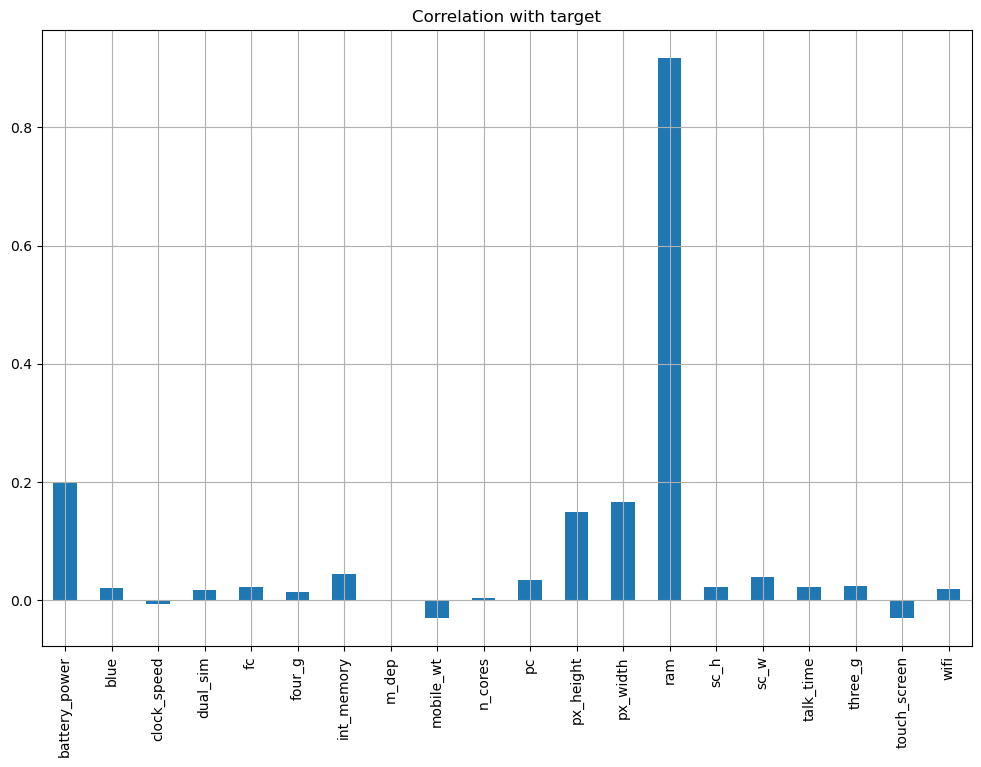

In [5]:
df.drop('price_range', axis=1).corrwith(df.price_range).plot(kind='bar', grid=True, figsize=(12, 8), 
                                                   title="Correlation with target")

In [6]:
df.drop('price_range', axis=1).corrwith(df.price_range)

battery_power    0.200723
blue             0.020573
clock_speed     -0.006606
dual_sim         0.017444
fc               0.021998
four_g           0.014772
int_memory       0.044435
m_dep            0.000853
mobile_wt       -0.030302
n_cores          0.004399
pc               0.033599
px_height        0.148858
px_width         0.165818
ram              0.917046
sc_h             0.022986
sc_w             0.038711
talk_time        0.021859
three_g          0.023611
touch_screen    -0.030411
wifi             0.018785
dtype: float64

#### drop the features has less correlated to the price_range

In [7]:
df.drop('clock_speed',inplace=True,axis=1)
df.drop('n_cores',inplace=True,axis=1)
df.drop('m_dep',inplace=True,axis=1)

In [9]:
df.shape

(2000, 18)

#### Feature Scalling

In [10]:
X=df.iloc[0:,:-1]
y=df['price_range']

In [11]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(X)

#### Splitting the dataset

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,r2_score
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

#### Machine learning models

#### LogisticRegression

In [14]:
from sklearn.linear_model import LogisticRegression
logistic=LogisticRegression()
logistic.fit(X_train,y_train)
ypred1=logistic.predict(X_test)
acc_logistic=accuracy_score(y_test,ypred1)
print("Accuracy score by logistic regression " ,acc_logistic)

Accuracy score by logistic regression  0.9525


In [15]:
print("The confusion_matrix ",confusion_matrix(y_test,ypred1))

The confusion_matrix  [[ 92   3   0   0]
 [  2  86   4   0]
 [  0   5  90   4]
 [  0   0   1 113]]


In [16]:
print(" The classification_report ",classification_report(y_test,ypred1))

 The classification_report                precision    recall  f1-score   support

           0       0.98      0.97      0.97        95
           1       0.91      0.93      0.92        92
           2       0.95      0.91      0.93        99
           3       0.97      0.99      0.98       114

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



#### SVM with GridSearch

In [17]:
from sklearn.svm import SVC
svm=SVC()
svm.fit(X_train,y_train)
ypred2=svm.predict(X_test)
acc_svm=accuracy_score(y_test,ypred2)
acc_svm

0.9125

In [18]:
# Perameter Tuning
from sklearn.model_selection import GridSearchCV
parameters = { 'kernel':['rbf','linear'],
                'C':[1,10,100,500,1000,10000],
                'gamma' : [0.01,0.1,0.5,1.0]}
svm_GS=GridSearchCV(SVC(),parameters)
svm_GS.fit(X_train, y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 10, 100, 500, 1000, 10000],
                         'gamma': [0.01, 0.1, 0.5, 1.0],
                         'kernel': ['rbf', 'linear']})

In [19]:
svm_GS.best_params_

{'C': 10, 'gamma': 0.01, 'kernel': 'linear'}

In [20]:
svm=SVC(C=10,gamma=0.01,kernel='rbf')
svm.fit(X_train,y_train)
ypred2=svm.predict(X_test)
acc_svm=accuracy_score(y_test,ypred2)
print("Accuracy score by svm ",acc_svm)

Accuracy score by svm  0.94


In [21]:
print("The confusion_matrix ",confusion_matrix(y_test,ypred2))

The confusion_matrix  [[ 91   4   0   0]
 [  4  85   3   0]
 [  0   6  90   3]
 [  0   0   4 110]]


In [22]:
print(" The classification_report ",classification_report(y_test,ypred2))

 The classification_report                precision    recall  f1-score   support

           0       0.96      0.96      0.96        95
           1       0.89      0.92      0.91        92
           2       0.93      0.91      0.92        99
           3       0.97      0.96      0.97       114

    accuracy                           0.94       400
   macro avg       0.94      0.94      0.94       400
weighted avg       0.94      0.94      0.94       400



#### KNN with parameter Tuning

In [26]:
from sklearn.neighbors import KNeighborsClassifier
knn_model=KNeighborsClassifier(n_neighbors=79)
knn_model.fit(X_train,y_train)
ypred3=knn_model.predict(X_test)
knn_acc=accuracy_score(y_test,ypred3)
print("Accuracy score by knn ",knn_acc)

Accuracy score by knn  0.69


In [27]:
print("The confusion_matrix ",confusion_matrix(y_test,ypred3))

The confusion_matrix  [[81 14  0  0]
 [30 49 12  1]
 [ 1 27 62  9]
 [ 0  0 30 84]]


In [28]:
print(" The classification_report ",classification_report(y_test,ypred3))

 The classification_report                precision    recall  f1-score   support

           0       0.72      0.85      0.78        95
           1       0.54      0.53      0.54        92
           2       0.60      0.63      0.61        99
           3       0.89      0.74      0.81       114

    accuracy                           0.69       400
   macro avg       0.69      0.69      0.68       400
weighted avg       0.70      0.69      0.69       400



#### DecisionTree with GridSearchCV

In [30]:
from sklearn.tree import DecisionTreeClassifier

classifier_dtg=DecisionTreeClassifier(random_state=42,splitter='best')
parameters=[{'min_samples_split':[2,3,4,5],'criterion':['gini']},{'min_samples_split':[2,3,4,5],'criterion':['entropy']}]

model_griddtree=GridSearchCV(estimator=classifier_dtg, param_grid=parameters, scoring='accuracy',cv=10)
model_griddtree.fit(X_train,y_train)
model_griddtree.best_params_
ypred4= model_griddtree.predict(X_test)
acc_ds=accuracy_score(y_test,ypred4)
print("Accuracy score by decision tree ",acc_ds)

Accuracy score by decision tree  0.875


In [31]:
print("The confusion_matrix ",confusion_matrix(y_test,ypred4))

The confusion_matrix  [[ 87   8   0   0]
 [  6  79   7   0]
 [  0  11  80   8]
 [  0   0  10 104]]


In [32]:
print(" The classification_report ",classification_report(y_test,ypred4))

 The classification_report                precision    recall  f1-score   support

           0       0.94      0.92      0.93        95
           1       0.81      0.86      0.83        92
           2       0.82      0.81      0.82        99
           3       0.93      0.91      0.92       114

    accuracy                           0.88       400
   macro avg       0.87      0.87      0.87       400
weighted avg       0.88      0.88      0.88       400



#### RandomForest with GridSerachCV

In [33]:
from sklearn.ensemble import RandomForestClassifier
rfg_model=RandomForestClassifier(random_state=33,n_estimators=23)
parameters=[{'min_samples_split':[2,3,4,5],'criterion':['gini','entropy'],'min_samples_leaf':[1,2,3]}]

model_gridrf=GridSearchCV(estimator=rfg_model, param_grid=parameters, scoring='accuracy',cv=10)
model_gridrf.fit(X_train,y_train)
ypred5= model_gridrf.predict(X_test)
acc_rf=accuracy_score(y_test,ypred5)
print("Accuracy score by random forest ",acc_rf)

Accuracy score by random forest  0.8675


In [34]:
print("The confusion_matrix ",confusion_matrix(y_test,ypred5))

The confusion_matrix  [[ 92   3   0   0]
 [  5  75  12   0]
 [  0  14  74  11]
 [  0   0   8 106]]


In [35]:
print(" The classification_report ",classification_report(y_test,ypred5))

 The classification_report                precision    recall  f1-score   support

           0       0.95      0.97      0.96        95
           1       0.82      0.82      0.82        92
           2       0.79      0.75      0.77        99
           3       0.91      0.93      0.92       114

    accuracy                           0.87       400
   macro avg       0.86      0.87      0.86       400
weighted avg       0.87      0.87      0.87       400



#### Accuracy mesure 

In [40]:
acc=[acc_logistic,acc_svm,knn_acc,acc_ds,acc_rf]
algorithm=['logisticRegression','SVM','KNN','DecisionTree','RandomForest']
for i in  range(len(acc)):
    print(algorithm[i],'has accuracy:',acc[i])

logisticRegression has accuracy: 0.9525
SVM has accuracy: 0.94
KNN has accuracy: 0.69
DecisionTree has accuracy: 0.875
RandomForest has accuracy: 0.8675


#### Conclusion:
Logistic Regression achieves the highest accuracy of 0.9525, outperforming all other models in this evaluation. Thus, it can be considered the best model for this specific dataset and problem among the ones tested.